# Battle of the Neighborhoods

Finding the best Neighbourhood in Toronto using Data Science

 

**Segment and Cluster Neighborhoods in Toronto, Ontario to find best neighborhood to open steak house with online food delivery option.**

*Author: Subha Halder*

===========================================

# Census Data for Toronto Neighborhood
 

In [139]:
import pandas as pd
import numpy as np

import json

import geocoder
from geopy.geocoders import Nominatim

import matplotlib.pyplot as plt

import folium
print('libraries imported')

libraries imported


Toronto City Census Data:

Toronto city neighbourhood census data collected from Toronto Open Portal: Toronto.ca

In [2]:
filepath = "/Users/NabanitaHalder/Projects/Toronto_census.csv"
df_census = pd.read_csv(filepath)

df_census.head()

,AREA_S_CD,AREA_NAME,POPULATION,DENSITY (PER SQ KM),CHILDREN,YOUTH,WORKING_AGE,PRE_RETIREMENT,SENIORS,MEDIAN_HOUSEHOLD_INCOME,MEDIAN_FAMILY_INCOME,WITHOUT_INCOME
0,1,West Humber-Clairville (1),33312,1117,15,16,42,12,14,70741,78190,5.6
1,2,Mount Olive-Silverstone-Jamestown (2),32954,7291,22,16,41,11,11,55334,60165,7.3
2,3,Thistletown-Beaumond Heights (3),10360,3130,17,13,41,12,17,65459,69851,5.0
3,4,Rexdale-Kipling (4),10529,4229,16,13,41,15,15,63232,78545,5.4
4,5,Elms-Old Rexdale (5),9456,3306,19,15,39,14,14,59576,68176,6.2


**Age Demigraphic for Restaurants**

Data collected from: https://scholarsarchive.jwu.edu/cgi/viewcontent.cgi?article=1008&context=mba_student

In [110]:
filepath = "/Users/NabanitaHalder/Projects/Demographic/Sheet 2-Table 1.csv"
df_demographic = pd.read_csv(filepath)

df_demographic.drop(['Unnamed: 0'],axis = 1, inplace = True)

df_demographic

,AGE DEMOGRAPHIC,ANUAL SPENDING ($),SPENDING FREQUENCY
0,YOUTH (UNDER 24),4073,4.073
1,WORKING AGE (25 to 54),20804,6.935
2,PRE-Retirement (55 to 64),6068,6.068
3,SENIOR (65+),9021,4.510


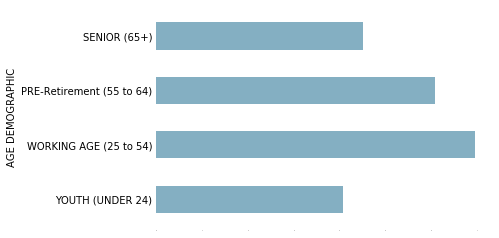

In [149]:
fig, ax = plt.subplots()
ax = plt.axes(frameon = False)
plt.tick_params(axis= 'x', labelsize=0, length = 0)
plt.tick_params(axis = 'y', length = 0)
df_demographic.plot(x='AGE DEMOGRAPHIC', y='SPENDING FREQUENCY', kind = 'barh', ax = ax, legend = False, color = '#84afc2')

Data Wrangling and Adding another weighted feature = Density * Median Household Income

In [3]:
# Data Wrangling
df_census.rename(columns = {"DENSITY (PER SQ KM)": "DENSITY"}, inplace = True)

# Weighted_Feature = Density * Median_Household_Income * SUM(percentage of age group in area * spending frequency)
df_census["WEIGHTED_FEATURE"] = df_census["DENSITY"]/1000 * (df_census["MEDIAN_HOUSEHOLD_INCOME"] *(100-df_census["WITHOUT_INCOME"])/100 )/10000 * (4.073*(df_census["CHILDREN"]/10 + df_census["YOUTH"]/10) + 6.935*df_census["WORKING_AGE"]/10 + 6.068*df_census["PRE_RETIREMENT"]/10 + 4.51*df_census["SENIORS"]/10)
df_census.head()

,AREA_S_CD,AREA_NAME,POPULATION,DENSITY,CHILDREN,YOUTH,WORKING_AGE,PRE_RETIREMENT,SENIORS,MEDIAN_HOUSEHOLD_INCOME,MEDIAN_FAMILY_INCOME,WITHOUT_INCOME,WEIGHTED_FEATURE
0,1,West Humber-Clairville (1),33312,1117,15,16,42,12,14,70741,78190,5.6,412.862422
1,2,Mount Olive-Silverstone-Jamestown (2),32954,7291,22,16,41,11,11,55334,60165,7.3,2077.385811
2,3,Thistletown-Beaumond Heights (3),10360,3130,17,13,41,12,17,65459,69851,5.0,1082.232802
3,4,Rexdale-Kipling (4),10529,4229,16,13,41,15,15,63232,78545,5.4,1419.459601
4,5,Elms-Old Rexdale (5),9456,3306,19,15,39,14,14,59576,68176,6.2,1029.111973


# Census Map for Toronto Neighbourhoods

In [4]:
# Filepath for GeoJson
geo_ = '/Users/NabanitaHalder/Projects/IBM Data Science Projects/Applied Data Science Capstone/Toronto_git.geojson'

# Get coordinates for Toronto,Ontario
address = 'Toronto, Ontario'

geolocator = Nominatim(user_agent="toronto_explorer")
location = geolocator.geocode(address)
lat_data = location.latitude
lng_data = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(lat_data, lng_data))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


### Density: Choropleth Map

In [5]:
map_dnst = folium.Map(location = [lat_data, lng_data], zoom_start = 10)

bins_dnst = list(df_census["DENSITY"].quantile([0,0.25,0.5,0.75,1]))

dnst = []
for i in range(5):
    dnst.append(int(bins_dnst[i]))

dnst[4] = dnst[4]+1

map_dnst.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','DENSITY'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = dnst,
        fill_color = 'YlOrRd',
        fill_opacity = 0.7,
        line_opacity = 0.2,
        legend_name = 'Pupolation Density per square KM'
    )
map_dnst

Neighbourhood with most population density per sq KM: North St.James Town

In [6]:
df_census[df_census['DENSITY']==df_census['DENSITY'].max()]

,AREA_S_CD,AREA_NAME,POPULATION,DENSITY,CHILDREN,YOUTH,WORKING_AGE,PRE_RETIREMENT,SENIORS,MEDIAN_HOUSEHOLD_INCOME,MEDIAN_FAMILY_INCOME,WITHOUT_INCOME,WEIGHTED_FEATURE
73,74,North St.James Town (74),18615,44321,12,12,56,10,9,41016,53444,4.8,10165.305548


### Median Household Income: Choropleth Map

In [7]:
map_mhi = folium.Map(location = [lat_data, lng_data], zoom_start = 10)

bins_mhi = list(df_census["MEDIAN_HOUSEHOLD_INCOME"].quantile([0,0.25,0.5,0.75,1]))

mhi = []
for i in range(5):
    mhi.append(int(bins_mhi[i]))

mhi[4] = mhi[4]+1

map_mhi.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','MEDIAN_HOUSEHOLD_INCOME'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = mhi,
        fill_color = 'YlOrRd',
        fill_opacity = 0.7,
        line_opacity = 0.2,
        legend_name = 'Median Household Income Distribution'
    )
map_mhi

Neighbourhood with most Most Household Income: Bridle Path-Sunnybrook-York Mills

In [8]:
df_census[df_census['MEDIAN_HOUSEHOLD_INCOME']==df_census['MEDIAN_HOUSEHOLD_INCOME'].max()]

,AREA_S_CD,AREA_NAME,POPULATION,DENSITY,CHILDREN,YOUTH,WORKING_AGE,PRE_RETIREMENT,SENIORS,MEDIAN_HOUSEHOLD_INCOME,MEDIAN_FAMILY_INCOME,WITHOUT_INCOME,WEIGHTED_FEATURE
40,41,Bridle Path-Sunnybrook-York Mills (41),9266,1040,16,16,33,16,19,215798,266931,5.0,1155.523563


### Weighted Feature: Coropleth Map

In [9]:
map_wf = folium.Map(location = [lat_data, lng_data], zoom_start = 10)

bins_wf = list(df_census["WEIGHTED_FEATURE"].quantile([0,0.25,0.5,0.75,1]))

wf = []
for i in range(5):
    wf.append(int(bins_wf[i]))

wf[4] = wf[4]+1

map_wf.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','WEIGHTED_FEATURE'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = wf,
        fill_color = 'YlOrRd',
        fill_opacity = 0.7,
        line_opacity = 0.2,
        legend_name = 'Weighted Feature'
    )
map_wf

Neighbourhood with most Hieghest Weighted Feature: North St.James Town

In [10]:
df_sorted_wf = df_census.sort_values(by=['WEIGHTED_FEATURE'], ascending=False)

df_sorted_wf.head(10)

,AREA_S_CD,AREA_NAME,POPULATION,DENSITY,CHILDREN,YOUTH,WORKING_AGE,PRE_RETIREMENT,SENIORS,MEDIAN_HOUSEHOLD_INCOME,MEDIAN_FAMILY_INCOME,WITHOUT_INCOME,WEIGHTED_FEATURE
73,74,North St.James Town (74),18615,44321,12,12,56,10,9,41016,53444,4.8,10165.305548
103,104,Mount Pleasant West (104),29658,21969,8,9,59,10,13,61839,86910,3.6,7827.889062
74,75,Church-Yonge Corridor (75),31340,23044,4,15,61,10,10,56366,90519,2.5,7677.097627
81,82,Niagara (82),31180,10156,7,8,75,6,5,79441,110064,1.6,5082.334419
83,84,Little Portugal (84),15559,12859,9,11,62,8,10,66542,87453,2.1,5068.672483
104,105,Lawrence Park North (105),14607,6407,23,12,41,12,13,144963,190036,4.2,4967.902137
96,97,Yonge-St.Clair (97),12528,10708,10,8,48,12,23,80136,131163,2.7,4865.457610
72,73,Moss Park (73),20506,14753,8,11,62,11,9,52490,87869,2.4,4645.863155
87,88,High Park North (88),22162,11726,13,9,53,12,13,68116,101807,3.8,4522.718123
94,95,Annex (95),30526,10863,8,12,51,11,17,71053,126750,2.6,4349.524808


# Most Visited Venues Data: Toronto

In [11]:
import requests

import copy

from folium.plugins import HeatMap

print("Libraries Imported")

Libraries Imported


Location Data Imported from Geocoder API for Neighbourhoods

In [12]:
# Web-scrapping data to design dataframe
df = pd.read_html('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M', header = 0)[0]

# Drop rows containing 'Not assigned'
index_names = df[df['Borough'] == 'Not assigned' ].index
df.drop(index_names, inplace = True)

# Reset Index
df.reset_index(drop=True, inplace = True)

print('Toronto Neiborhoods with Postal Code:\n')
print(df.head())

print('\nIf any other value is Not assigned in Neighborhoods: {}'.format('Not assigned' in df['Neighbourhood']))
print('\nShape of the dataframe: {}'.format(df.shape))

Toronto Neiborhoods with Postal Code:

  Postal Code           Borough                                Neighbourhood
0         M3A        North York                                    Parkwoods
1         M4A        North York                             Victoria Village
2         M5A  Downtown Toronto                    Regent Park, Harbourfront
3         M6A        North York             Lawrence Manor, Lawrence Heights
4         M7A  Downtown Toronto  Queen's Park, Ontario Provincial Government

If any other value is Not assigned in Neighborhoods: False

Shape of the dataframe: (103, 3)


In [13]:
# Read Latitude and Longitude data
df_lat_lng = pd.read_csv('Geospatial_Coordinates.csv')

# Initialize lists to None
lats = []
longs = []

# Loop through Postal Codes to get latitude and longitude data
for i in range(0,len(df.index)):
    for j in range(0, len(df_lat_lng.index)):
        if df['Postal Code'][i] == df_lat_lng['Postal Code'][j]:
            x = df_lat_lng['Latitude'][j]
            y = df_lat_lng['Longitude'][j]
            lats.append(x)
            longs.append(y)

# Create latitude and longitude using lists
df['Latitude'] = lats
df['Longitude'] = longs

df.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


In [14]:
CLIENT_ID = 'NI25RSRFXCO4JJAXDZFMT3KJ5SB1TTUS2JINAQMU4OCK1QAG'
CLIENT_SECRET = 'Z3DGZ5CVLJKW2JQBESRCOTSTKXMNDJY1IXWMK5OU0NPL01VZ'
VERSION = '20201030'
LIMIT = 100

print('credentails imported')

credentails imported


In [15]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [16]:
All_Venues = getNearbyVenues(names=df['Neighbourhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Queen's Park, Ontario Provincial Government
Islington Avenue, Humber Valley Village
Malvern, Rouge
Don Mills
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto, Broadview North (Old East York)
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmo

In [18]:
print('Shape of All Venues:', All_Venues.shape)
Restaurants = copy.deepcopy(All_Venues)
Restaurants.head()

Shape of All Venues: (2136, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park
1,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop
2,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena
3,Victoria Village,43.725882,-79.315572,Portugril,43.725819,-79.312785,Portuguese Restaurant
4,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop


In [19]:
# All Venues except Restaurants
df_restaurants = All_Venues[All_Venues['Venue Category'].str.contains("Restaurant")| All_Venues['Venue Category'].str.contains("Steakhouse")]

list_restaurants = []
list_restaurants = df_restaurants['Venue Category'].tolist()

for i in range(len(df_restaurants)):
    index_names = All_Venues[All_Venues['Venue Category'] == list_restaurants[i]].index
    All_Venues.drop(index_names, inplace = True)
    
All_Venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Brookbanks Park,43.751976,-79.332140,Park
1,Parkwoods,43.753259,-79.329656,Variety Store,43.751974,-79.333114,Food & Drink Shop
2,Victoria Village,43.725882,-79.315572,Victoria Village Arena,43.723481,-79.315635,Hockey Arena
4,Victoria Village,43.725882,-79.315572,Tim Hortons,43.725517,-79.313103,Coffee Shop
5,Victoria Village,43.725882,-79.315572,Eglinton Ave E & Sloane Ave/Bermondsey Rd,43.726086,-79.313620,Intersection


In [20]:
# Dataframe Steakhouse
df_steakhouse = Restaurants[Restaurants['Venue Category'].str.contains("Steakhouse")]

df_steakhouse.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
148,"Garden District, Ryerson",43.657162,-79.378937,Barberian's Steak House,43.657755,-79.382177,Steakhouse
396,Berczy Park,43.644771,-79.373306,Harbour 60 Toronto,43.642220,-79.377945,Steakhouse
599,"Richmond, Adelaide, King",43.650571,-79.384568,Hy's Steakhouse,43.649505,-79.382919,Steakhouse
617,"Richmond, Adelaide, King",43.650571,-79.384568,Michael's on Simcoe,43.648269,-79.386328,Steakhouse
834,"Harbourfront East, Union Station, Toronto Islands",43.640816,-79.381752,Harbour 60 Toronto,43.642220,-79.377945,Steakhouse


# Map of Venues  in Toronto Neighborhoods

In [21]:
# Heatmap of all venues
map_venues = folium.Map(location=[lat_data, lng_data], zoom_start=10)

HeatMap(data = All_Venues[['Venue Latitude', 'Venue Longitude']].groupby(['Venue Latitude', 'Venue Longitude']).sum().reset_index().values.tolist(),
        radius=8, max_zoom=13).add_to(map_venues)
map_venues

In [22]:
# Map with Steakhouses marked
map_steakhouse = folium.Map(location=[lat_data, lng_data], zoom_start=10)

map_steakhouse.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','WEIGHTED_FEATURE'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = [412, 1280, 1792, 2916, 10166],
        fill_color = 'YlOrRd',
        fill_opacity = 0.7,
        line_opacity = 0.2,
        legend_name = 'Weighted Feature'
    )

for neighborhood, venue, lat, lng in zip(df_steakhouse['Neighborhood'],
                                                         df_steakhouse['Venue'],
                                                         df_steakhouse['Venue Latitude'],
                                                         df_steakhouse['Venue Longitude']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_steakhouse)    
    
map_steakhouse

In [23]:
# Heatmap of all venues and marker of steakhouses superimposed on weighted feature
map_ = folium.Map(location=[lat_data, lng_data], tiles='cartodbpositron', zoom_start=10)

map_.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','WEIGHTED_FEATURE'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = [412, 1280, 1792, 2916, 10166],
        fill_color = 'BuPu',
        fill_opacity = 0.5,
        line_opacity = 0.4,
        legend_name = 'Weighted Feature'
    )

HeatMap(data = All_Venues[['Venue Latitude', 'Venue Longitude']].groupby(['Venue Latitude', 'Venue Longitude']).sum().reset_index().values.tolist(),
        radius=8, max_zoom=13).add_to(map_)

for neighborhood, venue, lat, lng in zip(df_steakhouse['Neighborhood'],
                                                         df_steakhouse['Venue'],
                                                         df_steakhouse['Venue Latitude'],
                                                         df_steakhouse['Venue Longitude']):
    label = '{}, {}'.format(venue, neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_)

map_

# Analysing Neighbourhoods

In [24]:
df.head(5)

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


Getting Number of Venues per Borough:

In [25]:
# Neighborhood Count per Borough
borough_count = df.groupby('Borough').count().reset_index()
borough_count.drop(['Postal Code','Neighbourhood','Latitude'],axis = 1, inplace = True)
borough_count.rename(columns = {'Longitude':'Neighborhood_Count'}, inplace = True)
borough_count.sort_values('Neighborhood_Count', axis = 0, ascending = False, inplace = True)
borough_count = borough_count.reset_index()
borough_count.drop(['index'],axis = 1, inplace = True)
borough_count.head()

,Borough,Neighborhood_Count
0,North York,24
1,Downtown Toronto,19
2,Scarborough,17
3,Etobicoke,12
4,Central Toronto,9


In [26]:
def get_Venues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [27]:
def numberofvenues(BOROUGH):
    df_borough = df[df["Borough"].str.contains("{}".format(BOROUGH))]
    borough_venues = getNearbyVenues(names = df_borough['Neighbourhood'],
                                  latitudes = df_borough["Latitude"],
                                  longitudes = df_borough["Longitude"])
    return borough_venues.shape

In [28]:
list_venue_count = []

for i in range(len(borough_count)):
    list_venue_count.append((numberofvenues(borough_count["Borough"][i]))[0])

list_venue_count

[239, 1248, 89, 74, 104, 153, 119, 77, 336, 13]

In [29]:
borough_count["Venue Count"] = list_venue_count

borough_count

,Borough,Neighborhood_Count,Venue Count
0,North York,24,239
1,Downtown Toronto,19,1248
2,Scarborough,17,89
3,Etobicoke,12,74
4,Central Toronto,9,104
5,West Toronto,6,153
6,East Toronto,5,119
7,East York,5,77
8,York,5,336
9,Mississauga,1,13


We see that Borough with most number of Venues is: Downtown Toronto.
So We will try to analyse it further.

# Analyse Downtown Toronto Neighborhood

In [30]:
df_downtown = df[df['Borough'].str.contains("Downtown")]

df_downtown.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937
15,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418
20,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306


In [31]:
from sklearn.cluster import KMeans

import matplotlib.cm as cm
import matplotlib.colors as colors

print("Libraries Imported")

Libraries Imported


In [65]:
df_downtown_venues = df[df["Borough"].str.contains("Downtown Toronto")]
downtown_venues_all = get_Venues(names = df_downtown_venues['Neighbourhood'],
                                  latitudes = df_downtown_venues["Latitude"],
                                  longitudes = df_downtown_venues["Longitude"])

downtown_venues_all.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.65426,-79.360636,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.65426,-79.360636,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.65426,-79.360636,Cooper Koo Family YMCA,43.653249,-79.358008,Distribution Center
3,"Regent Park, Harbourfront",43.65426,-79.360636,Body Blitz Spa East,43.654735,-79.359874,Spa
4,"Regent Park, Harbourfront",43.65426,-79.360636,Impact Kitchen,43.656369,-79.356980,Restaurant


In [67]:
downtown_onehot_all = pd.get_dummies(downtown_venues_all[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
downtown_onehot_all['Neighborhood'] = downtown_venues_all['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [downtown_onehot_all.columns[-1]] + list(downtown_onehot_all.columns[:-1])
downtown_onehot_all = downtown_onehot_all[fixed_columns]
downtown_onehot_all.head()

,Yoga Studio,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,...,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Group rows by nieghborhood and by taking mean of occurence of each feature

In [68]:
downtown_grouped_all = downtown_onehot_all.groupby('Neighborhood').mean().reset_index()
downtown_grouped_all.head(10)

,Neighborhood,Yoga Studio,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,...,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store
0,Berczy Park,0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.00,0.0,0.00,0.018182,0.00,0.000000,0.000000,0.0
1,"CN Tower, King and Spadina, Railway Lands, Har...",0.000000,0.000000,0.0625,0.0625,0.0625,0.125,0.125,0.0625,0.000000,...,0.000000,0.000000,0.00,0.0,0.00,0.000000,0.00,0.000000,0.000000,0.0
2,Central Bay Street,0.014706,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.00,0.0,0.00,0.014706,0.00,0.000000,0.014706,0.0
3,Christie,0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.00,0.0,0.00,0.000000,0.00,0.000000,0.000000,0.0
4,Church and Wellesley,0.026667,0.013333,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.013333,...,0.013333,0.013333,0.00,0.0,0.00,0.000000,0.00,0.013333,0.000000,0.0
5,"Commerce Court, Victoria Hotel",0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.040000,...,0.000000,0.000000,0.00,0.0,0.00,0.020000,0.00,0.000000,0.010000,0.0
6,"First Canadian Place, Underground city",0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.040000,...,0.010000,0.000000,0.00,0.0,0.01,0.010000,0.00,0.000000,0.010000,0.0
7,"Garden District, Ryerson",0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.020000,0.000000,0.01,0.0,0.00,0.000000,0.01,0.010000,0.010000,0.0
8,"Harbourfront East, Union Station, Toronto Islands",0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.010000,0.000000,0.00,0.0,0.01,0.010000,0.00,0.000000,0.010000,0.0
9,"Kensington Market, Chinatown, Grange Park",0.000000,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.000000,...,0.000000,0.000000,0.00,0.0,0.00,0.054054,0.00,0.040541,0.013514,0.0


### Print each neighborhood along with the top 5 most common venues except restaurants and steakhouse

In [69]:
num_top_venues = 5

for hood in downtown_grouped_all['Neighborhood']:
    print("----"+hood+"----")
    temp = downtown_grouped_all[downtown_grouped_all['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Berczy Park----
          venue  freq
0   Coffee Shop  0.09
1      Beer Bar  0.04
2        Bakery  0.04
3  Cocktail Bar  0.04
4   Cheese Shop  0.04


----CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport----
             venue  freq
0   Airport Lounge  0.12
1  Airport Service  0.12
2      Coffee Shop  0.06
3              Bar  0.06
4    Boat or Ferry  0.06


----Central Bay Street----
                venue  freq
0         Coffee Shop  0.18
1                Café  0.06
2      Sandwich Place  0.04
3  Italian Restaurant  0.04
4     Thai Restaurant  0.03


----Christie----
                venue  freq
0       Grocery Store  0.25
1                Café  0.19
2                Park  0.12
3  Athletics & Sports  0.06
4           Nightclub  0.06


----Church and Wellesley----
                 venue  freq
0          Coffee Shop  0.09
1  Japanese Restaurant  0.05
2     Sushi Restaurant  0.05
3              Gay Bar  0.05
4           Restauran

### Define function to sort the venues in descending order

In [70]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

### Create a dataframe and display the top 10 venues for each neighborhood

In [71]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_all_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_all_venues_sorted['Neighborhood'] = downtown_grouped_all['Neighborhood']

for ind in np.arange(downtown_grouped_all.shape[0]):
    neighborhoods_all_venues_sorted.iloc[ind, 1:] = return_most_common_venues(downtown_grouped_all.iloc[ind, :], num_top_venues)

neighborhoods_all_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Berczy Park,Coffee Shop,Seafood Restaurant,Cocktail Bar,Bakery,Cheese Shop,Beer Bar,Restaurant,Farmers Market,Hotel,Italian Restaurant
1,"CN Tower, King and Spadina, Railway Lands, Har...",Airport Lounge,Airport Service,Boutique,Sculpture Garden,Plane,Rental Car Location,Coffee Shop,Bar,Harbor / Marina,Boat or Ferry
2,Central Bay Street,Coffee Shop,Café,Sandwich Place,Italian Restaurant,Salad Place,Burger Joint,Japanese Restaurant,Department Store,Thai Restaurant,Bubble Tea Shop
3,Christie,Grocery Store,Café,Park,Candy Store,Nightclub,Coffee Shop,Restaurant,Italian Restaurant,Athletics & Sports,Baby Store
4,Church and Wellesley,Coffee Shop,Japanese Restaurant,Gay Bar,Sushi Restaurant,Restaurant,Yoga Studio,Men's Store,Mediterranean Restaurant,Hotel,Pub


In [72]:
neighborhoods_all_venues_sorted.shape

(19, 11)

### Run k-means to cluster the neighborhood into 5 clusters

In [73]:
k_cluster = 5

downtown_grouped_clustering_all = downtown_grouped_all.drop('Neighborhood', 1)

k_means_all = KMeans(n_clusters=k_cluster, random_state=0).fit(downtown_grouped_clustering_all)

k_means_all.labels_[0:10]

array([4, 3, 0, 2, 4, 4, 4, 4, 0, 4], dtype=int32)

### create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood

In [74]:
neighborhoods_all_venues_sorted.insert(0, 'Cluster Labels', k_means_all.labels_)

downtown_merged_all = df_downtown

downtown_merged_all = downtown_merged_all.join(neighborhoods_all_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

downtown_merged_all.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,0,Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Mexican Restaurant,Restaurant
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,0,Coffee Shop,Gym,Diner,Restaurant,Portuguese Restaurant,Park,Music Venue,Mexican Restaurant,Italian Restaurant,Hobby Shop
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937,4,Clothing Store,Coffee Shop,Café,Bubble Tea Shop,Cosmetics Shop,Japanese Restaurant,Ramen Restaurant,Hotel,Italian Restaurant,Lingerie Store
15,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,4,Coffee Shop,Café,Cocktail Bar,Restaurant,Gastropub,American Restaurant,Beer Bar,Gym,Seafood Restaurant,Farmers Market
20,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,4,Coffee Shop,Seafood Restaurant,Cocktail Bar,Bakery,Cheese Shop,Beer Bar,Restaurant,Farmers Market,Hotel,Italian Restaurant


In [75]:
downtown_merged_all = downtown_merged_all.fillna(0)
downtown_merged_all["Cluster Labels"] = downtown_merged_all["Cluster Labels"].astype(int)
downtown_merged_all.dtypes

Postal Code                object
Borough                    object
Neighbourhood              object
Latitude                  float64
Longitude                 float64
Cluster Labels              int64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

### Visualise the result

In [77]:
map_clusters_all = folium.Map(location=[lat_data, lng_data], zoom_start=11)

x = np.arange(k_cluster)
ys = [i + x + (i*x)**2 for i in range(k_cluster)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(downtown_merged_all['Latitude'], downtown_merged_all['Longitude'], downtown_merged_all['Neighbourhood'], downtown_merged_all['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_all)
       
map_clusters_all

### Examine Results

In [78]:
Red_Cluster = downtown_merged_all.loc[downtown_merged_all['Cluster Labels'] == 0, downtown_merged_all.columns[[1] + list(range(5, downtown_merged_all.shape[1]))]]
Red_Cluster

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Downtown Toronto,0,Coffee Shop,Bakery,Pub,Park,Breakfast Spot,Café,Theater,Yoga Studio,Mexican Restaurant,Restaurant
4,Downtown Toronto,0,Coffee Shop,Gym,Diner,Restaurant,Portuguese Restaurant,Park,Music Venue,Mexican Restaurant,Italian Restaurant,Hobby Shop
24,Downtown Toronto,0,Coffee Shop,Café,Sandwich Place,Italian Restaurant,Salad Place,Burger Joint,Japanese Restaurant,Department Store,Thai Restaurant,Bubble Tea Shop
36,Downtown Toronto,0,Coffee Shop,Aquarium,Hotel,Café,Fried Chicken Joint,Restaurant,Brewery,Scenic Lookout,Music Venue,Italian Restaurant


In [79]:
Blue_Cluster = downtown_merged_all.loc[downtown_merged_all['Cluster Labels'] == 1, downtown_merged_all.columns[[1] + list(range(5, downtown_merged_all.shape[1]))]]
Blue_Cluster

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
91,Downtown Toronto,1,Park,Trail,Playground,Creperie,Doner Restaurant,Dog Run,Distribution Center,Discount Store,Diner,Dim Sum Restaurant


In [80]:
Orchid_Cluster = downtown_merged_all.loc[downtown_merged_all['Cluster Labels'] == 2, downtown_merged_all.columns[[1] + list(range(5, downtown_merged_all.shape[1]))]]
Orchid_Cluster

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
25,Downtown Toronto,2,Grocery Store,Café,Park,Candy Store,Nightclub,Coffee Shop,Restaurant,Italian Restaurant,Athletics & Sports,Baby Store


In [81]:
Wheat_Cluster = downtown_merged_all.loc[downtown_merged_all['Cluster Labels'] == 3, downtown_merged_all.columns[[1] + list(range(5, downtown_merged_all.shape[1]))]]
Wheat_Cluster

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
87,Downtown Toronto,3,Airport Lounge,Airport Service,Boutique,Sculpture Garden,Plane,Rental Car Location,Coffee Shop,Bar,Harbor / Marina,Boat or Ferry


In [82]:
Green_Cluster = downtown_merged_all.loc[downtown_merged_all['Cluster Labels'] == 4, downtown_merged_all.columns[[1] + list(range(5, downtown_merged_all.shape[1]))]]
Green_Cluster

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,Downtown Toronto,4,Clothing Store,Coffee Shop,Café,Bubble Tea Shop,Cosmetics Shop,Japanese Restaurant,Ramen Restaurant,Hotel,Italian Restaurant,Lingerie Store
15,Downtown Toronto,4,Coffee Shop,Café,Cocktail Bar,Restaurant,Gastropub,American Restaurant,Beer Bar,Gym,Seafood Restaurant,Farmers Market
20,Downtown Toronto,4,Coffee Shop,Seafood Restaurant,Cocktail Bar,Bakery,Cheese Shop,Beer Bar,Restaurant,Farmers Market,Hotel,Italian Restaurant
30,Downtown Toronto,4,Coffee Shop,Café,Gym,Restaurant,Hotel,Bar,Thai Restaurant,Clothing Store,Sushi Restaurant,Juice Bar
42,Downtown Toronto,4,Coffee Shop,Hotel,Restaurant,Café,Salad Place,Seafood Restaurant,American Restaurant,Japanese Restaurant,Italian Restaurant,Bar
48,Downtown Toronto,4,Coffee Shop,Restaurant,Hotel,Café,American Restaurant,Gym,Seafood Restaurant,Deli / Bodega,Japanese Restaurant,Cocktail Bar
80,Downtown Toronto,4,Café,Bookstore,Sandwich Place,Bar,Bakery,Japanese Restaurant,Pub,Bank,Dessert Shop,Restaurant
84,Downtown Toronto,4,Mexican Restaurant,Coffee Shop,Vegetarian / Vegan Restaurant,Bar,Café,Vietnamese Restaurant,Bakery,Dessert Shop,Gaming Cafe,Park
92,Downtown Toronto,4,Coffee Shop,Italian Restaurant,Pub,Japanese Restaurant,Restaurant,Hotel,Beer Bar,Seafood Restaurant,Café,Gym
96,Downtown Toronto,4,Coffee Shop,Café,Pizza Place,Restaurant,Pub,Chinese Restaurant,Market,Bakery,Park,Italian Restaurant


# Exploring Downtown Neighborhoods except Restaurants and Steakhouses

In [83]:
downtown_venues_all.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.65426,-79.360636,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.65426,-79.360636,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.65426,-79.360636,Cooper Koo Family YMCA,43.653249,-79.358008,Distribution Center
3,"Regent Park, Harbourfront",43.65426,-79.360636,Body Blitz Spa East,43.654735,-79.359874,Spa
4,"Regent Park, Harbourfront",43.65426,-79.360636,Impact Kitchen,43.656369,-79.356980,Restaurant


### Drop restaurants and steakhouses from dataframe

In [84]:
# All Venues except Restaurants
downtown_restaurants = downtown_venues_all[downtown_venues_all['Venue Category'].str.contains("Restaurant")| downtown_venues_all['Venue Category'].str.contains("Steakhouse")]

list_restaurants = []
list_restaurants = downtown_restaurants['Venue Category'].tolist()

for i in range(len(downtown_restaurants)):
    index_names = downtown_venues_all[downtown_venues_all['Venue Category'] == list_restaurants[i]].index
    downtown_venues_all.drop(index_names, inplace = True)

downtown_venues = downtown_venues_all
downtown_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.65426,-79.360636,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.65426,-79.360636,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.65426,-79.360636,Cooper Koo Family YMCA,43.653249,-79.358008,Distribution Center
3,"Regent Park, Harbourfront",43.65426,-79.360636,Body Blitz Spa East,43.654735,-79.359874,Spa
5,"Regent Park, Harbourfront",43.65426,-79.360636,Corktown Common,43.655618,-79.356211,Park


In [85]:
downtown_onehot = pd.get_dummies(downtown_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
downtown_onehot['Neighborhood'] = downtown_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [downtown_onehot.columns[-1]] + list(downtown_onehot.columns[:-1])
downtown_onehot = downtown_onehot[fixed_columns]
downtown_onehot.head()

,Yoga Studio,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,Art Gallery,...,Tailor Shop,Tanning Salon,Tea Room,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Bar,Women's Store
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Group rows by nieghborhood and by taking mean of occurence of each feature

In [86]:
downtown_grouped = downtown_onehot.groupby('Neighborhood').mean().reset_index()
downtown_grouped.head(10)

,Neighborhood,Yoga Studio,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,Antique Shop,Aquarium,...,Tailor Shop,Tanning Salon,Tea Room,Theater,Toy / Game Store,Trail,Train Station,Video Game Store,Wine Bar,Women's Store
0,Berczy Park,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.024390,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
1,"CN Tower, King and Spadina, Railway Lands, Har...",0.000000,0.0625,0.0625,0.0625,0.125,0.125,0.0625,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
2,Central Bay Street,0.020833,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.000000,0.020833,0.000000,0.000000,0.0,0.000000,0.000000,0.020833,0.0
3,Christie,0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
4,Church and Wellesley,0.040000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.020000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
5,"Commerce Court, Victoria Hotel",0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.014286,0.000000,0.014286,0.000000,0.000000,0.0,0.000000,0.000000,0.014286,0.0
6,"First Canadian Place, Underground city",0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.000000,0.014706,0.014706,0.000000,0.0,0.014706,0.000000,0.014706,0.0
7,"Garden District, Ryerson",0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.012821,0.012821,0.025641,0.012821,0.0,0.000000,0.012821,0.012821,0.0
8,"Harbourfront East, Union Station, Toronto Islands",0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.057471,...,0.000000,0.000000,0.011494,0.011494,0.000000,0.0,0.011494,0.000000,0.011494,0.0
9,"Kensington Market, Chinatown, Grange Park",0.000000,0.0000,0.0000,0.0000,0.000,0.000,0.0000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.018868,0.0


### Print each neighborhood along with the top 5 most common venues except restaurants and steakhouse

In [87]:
num_top_venues = 5

for hood in downtown_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = downtown_grouped[downtown_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Berczy Park----
            venue  freq
0     Coffee Shop  0.12
1          Bakery  0.05
2    Cocktail Bar  0.05
3  Farmers Market  0.05
4        Beer Bar  0.05


----CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport----
             venue  freq
0   Airport Lounge  0.12
1  Airport Service  0.12
2      Coffee Shop  0.06
3         Boutique  0.06
4              Bar  0.06


----Central Bay Street----
              venue  freq
0       Coffee Shop  0.25
1              Café  0.08
2    Sandwich Place  0.06
3  Department Store  0.04
4   Bubble Tea Shop  0.04


----Christie----
                venue  freq
0       Grocery Store  0.29
1                Café  0.21
2                Park  0.14
3  Athletics & Sports  0.07
4         Coffee Shop  0.07


----Church and Wellesley----
         venue  freq
0  Coffee Shop  0.14
1      Gay Bar  0.08
2  Yoga Studio  0.04
3          Pub  0.04
4         Café  0.04


----Commerce Court, Victoria Hotel----

### Create a dataframe and display the top 10 venues for each neighborhood

In [88]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = downtown_grouped['Neighborhood']

for ind in np.arange(downtown_grouped_all.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(downtown_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Berczy Park,Coffee Shop,Bakery,Beer Bar,Cocktail Bar,Cheese Shop,Farmers Market,Shopping Mall,Hotel,Basketball Stadium,Beach
1,"CN Tower, King and Spadina, Railway Lands, Har...",Airport Lounge,Airport Service,Sculpture Garden,Harbor / Marina,Plane,Rental Car Location,Boutique,Boat or Ferry,Bar,Coffee Shop
2,Central Bay Street,Coffee Shop,Café,Sandwich Place,Salad Place,Bubble Tea Shop,Burger Joint,Department Store,Comic Shop,Bookstore,Poke Place
3,Christie,Grocery Store,Café,Park,Athletics & Sports,Candy Store,Nightclub,Baby Store,Coffee Shop,Fried Chicken Joint,Deli / Bodega
4,Church and Wellesley,Coffee Shop,Gay Bar,Yoga Studio,Pub,Hotel,Men's Store,Bubble Tea Shop,Café,Diner,Theater


In [89]:
neighborhoods_venues_sorted.shape

(19, 11)

### Run k-means to cluster the neighborhood into 5 clusters

In [90]:
k_cluster_ = 5

downtown_grouped_clustering = downtown_grouped.drop('Neighborhood', 1)

k_means_v = KMeans(n_clusters=k_cluster_, random_state=0).fit(downtown_grouped_clustering)

k_means_v.labels_[0:10]

array([1, 0, 1, 3, 1, 1, 1, 1, 1, 4], dtype=int32)

### create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood

In [91]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', k_means_v.labels_)

downtown_merged = df_downtown

downtown_merged = downtown_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

downtown_merged.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,1,Coffee Shop,Park,Pub,Bakery,Café,Theater,Breakfast Spot,Performing Arts Venue,Brewery,Event Space
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,1,Coffee Shop,Yoga Studio,College Auditorium,Bar,Sandwich Place,Beer Bar,Café,Music Venue,College Cafeteria,Smoothie Shop
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937,1,Clothing Store,Coffee Shop,Café,Bubble Tea Shop,Cosmetics Shop,Hotel,Theater,Bookstore,Lingerie Store,Pizza Place
15,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,1,Coffee Shop,Café,Cocktail Bar,Beer Bar,Gastropub,Lingerie Store,Hotel,Department Store,Clothing Store,Farmers Market
20,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,1,Coffee Shop,Bakery,Beer Bar,Cocktail Bar,Cheese Shop,Farmers Market,Shopping Mall,Hotel,Basketball Stadium,Beach


In [92]:
downtown_merged = downtown_merged.fillna(0)
downtown_merged["Cluster Labels"] = downtown_merged["Cluster Labels"].astype(int)
downtown_merged.dtypes

Postal Code                object
Borough                    object
Neighbourhood              object
Latitude                  float64
Longitude                 float64
Cluster Labels              int64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

 ### Visualise Results

In [93]:
map_clusters_ = folium.Map(location=[lat_data, lng_data], zoom_start=11)

x = np.arange(k_cluster_)
ys = [i + x + (i*x)**2 for i in range(k_cluster_)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(downtown_merged['Latitude'], downtown_merged['Longitude'], downtown_merged['Neighbourhood'], downtown_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_)
       
map_clusters_

In [150]:
Airport = downtown_merged.loc[downtown_merged['Cluster Labels'] == 0, downtown_merged.columns[[2] + list(range(5, downtown_merged.shape[1]))]]
Airport

,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
87,"CN Tower, King and Spadina, Railway Lands, Har...",0,Airport Lounge,Airport Service,Sculpture Garden,Harbor / Marina,Plane,Rental Car Location,Boutique,Boat or Ferry,Bar,Coffee Shop


In [151]:
Commerce = downtown_merged.loc[downtown_merged['Cluster Labels'] == 1, downtown_merged.columns[[2] + list(range(5, downtown_merged.shape[1]))]]
Commerce

,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,"Regent Park, Harbourfront",1,Coffee Shop,Park,Pub,Bakery,Café,Theater,Breakfast Spot,Performing Arts Venue,Brewery,Event Space
4,"Queen's Park, Ontario Provincial Government",1,Coffee Shop,Yoga Studio,College Auditorium,Bar,Sandwich Place,Beer Bar,Café,Music Venue,College Cafeteria,Smoothie Shop
9,"Garden District, Ryerson",1,Clothing Store,Coffee Shop,Café,Bubble Tea Shop,Cosmetics Shop,Hotel,Theater,Bookstore,Lingerie Store,Pizza Place
15,St. James Town,1,Coffee Shop,Café,Cocktail Bar,Beer Bar,Gastropub,Lingerie Store,Hotel,Department Store,Clothing Store,Farmers Market
20,Berczy Park,1,Coffee Shop,Bakery,Beer Bar,Cocktail Bar,Cheese Shop,Farmers Market,Shopping Mall,Hotel,Basketball Stadium,Beach
24,Central Bay Street,1,Coffee Shop,Café,Sandwich Place,Salad Place,Bubble Tea Shop,Burger Joint,Department Store,Comic Shop,Bookstore,Poke Place
30,"Richmond, Adelaide, King",1,Coffee Shop,Café,Gym,Bar,Hotel,Clothing Store,Salad Place,Deli / Bodega,Pizza Place,Office
36,"Harbourfront East, Union Station, Toronto Islands",1,Coffee Shop,Aquarium,Café,Hotel,Brewery,Scenic Lookout,Fried Chicken Joint,Music Venue,History Museum,Pizza Place
42,"Toronto Dominion Centre, Design Exchange",1,Coffee Shop,Hotel,Café,Salad Place,Bar,Beer Bar,Sporting Goods Shop,Gastropub,Bakery,Deli / Bodega
48,"Commerce Court, Victoria Hotel",1,Coffee Shop,Café,Hotel,Gym,Deli / Bodega,Cocktail Bar,Beer Bar,Gastropub,Breakfast Spot,Bakery


In [152]:
Parks = downtown_merged.loc[downtown_merged['Cluster Labels'] == 2, downtown_merged.columns[[2] + list(range(5, downtown_merged.shape[1]))]]
Parks

,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
91,Rosedale,2,Park,Trail,Playground,College Rec Center,Deli / Bodega,Dance Studio,Cupcake Shop,Creperie,Cosmetics Shop,Convenience Store


In [153]:
Residential = downtown_merged.loc[downtown_merged['Cluster Labels'] == 3, downtown_merged.columns[[2] + list(range(5, downtown_merged.shape[1]))]]
Residential

,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
25,Christie,3,Grocery Store,Café,Park,Athletics & Sports,Candy Store,Nightclub,Baby Store,Coffee Shop,Fried Chicken Joint,Deli / Bodega


In [154]:
Entertainment = downtown_merged.loc[downtown_merged['Cluster Labels'] == 4, downtown_merged.columns[[2] + list(range(5, downtown_merged.shape[1]))]]
Entertainment

,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
80,"University of Toronto, Harbord",4,Café,Bookstore,Bakery,Sandwich Place,Bar,Yoga Studio,Coffee Shop,College Arts Building,College Gym,Pub
84,"Kensington Market, Chinatown, Grange Park",4,Café,Coffee Shop,Bar,Bakery,Gaming Cafe,Dessert Shop,Park,Burger Joint,Pizza Place,Grocery Store
96,"St. James Town, Cabbagetown",4,Coffee Shop,Café,Pizza Place,Pub,Bakery,Market,Park,Plaza,Playground,Pharmacy


# Visualizing Findings

### Neighborhood clustered by all venues including Restaurants

In [134]:
# Neighborhood clustered by all venues superimposed on Choropleth Map for Weighted Feature:

map_final_1 = folium.Map(location = [lat_data, lng_data], zoom_start = 10)

bins_wf = list(df_census["WEIGHTED_FEATURE"].quantile([0,0.25,0.5,0.75,1]))

wf = []
for i in range(5):
    wf.append(int(bins_wf[i]))

wf[4] = wf[4]+1

map_final_1.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','WEIGHTED_FEATURE'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = wf,
        fill_color = 'YlOrRd',
        fill_opacity = 0.7,
        line_opacity = 0.2,
        legend_name = 'Weighted Feature'
    )

x = np.arange(k_cluster)
ys = [i + x + (i*x)**2 for i in range(k_cluster)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(downtown_merged_all['Latitude'], downtown_merged_all['Longitude'], downtown_merged_all['Neighbourhood'], downtown_merged_all['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_final_1)
    
map_final_1

 ### Neighborhood clustered by all venues excluding Rstaurants

In [133]:
# Neighborhood clustered by all venues excluding Rstaurants superimposed on Heatmap of All Venues:

map_final_2 = folium.Map(location=[lat_data, lng_data], tiles='cartodbpositron', zoom_start=10)

map_final_2.choropleth(
        geo_data = geo_,
        data = df_census,
        columns = ['AREA_NAME','WEIGHTED_FEATURE'],
        key_on = 'feature.properties.AREA_NAME',
        threshold_scale = [412, 1280, 1792, 2916, 10166],
        fill_color = 'BuPu',
        fill_opacity = 0.5,
        line_opacity = 0.4,
        legend_name = 'Weighted Feature'
    )

HeatMap(data = All_Venues[['Venue Latitude', 'Venue Longitude']].groupby(['Venue Latitude', 'Venue Longitude']).sum().reset_index().values.tolist(),
        radius=8, max_zoom=13).add_to(map_final_2)

x = np.arange(k_cluster_)
ys = [i + x + (i*x)**2 for i in range(k_cluster_)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(downtown_merged['Latitude'], downtown_merged['Longitude'], downtown_merged['Neighbourhood'], downtown_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_final_2)

map_final_2

### Venue Count per Neighborhood

In [155]:
downtown_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Regent Park, Harbourfront",43.65426,-79.360636,Roselle Desserts,43.653447,-79.362017,Bakery
1,"Regent Park, Harbourfront",43.65426,-79.360636,Tandem Coffee,43.653559,-79.361809,Coffee Shop
2,"Regent Park, Harbourfront",43.65426,-79.360636,Cooper Koo Family YMCA,43.653249,-79.358008,Distribution Center
3,"Regent Park, Harbourfront",43.65426,-79.360636,Body Blitz Spa East,43.654735,-79.359874,Spa
5,"Regent Park, Harbourfront",43.65426,-79.360636,Corktown Common,43.655618,-79.356211,Park


In [156]:
# Venue Count per Neighborhood
venue_count = downtown_venues.groupby('Neighborhood').count().reset_index()
venue_count.drop(['Neighborhood Latitude', 'Neighborhood Longitude','Venue Latitude','Venue Longitude','Venue Category'],axis = 1, inplace = True)
venue_count.rename(columns = {'Venue':'Venue_Count'}, inplace = True)

venue_count

,Neighborhood,Venue_Count
0,Berczy Park,41
1,"CN Tower, King and Spadina, Railway Lands, Har...",16
2,Central Bay Street,48
3,Christie,14
4,Church and Wellesley,50
5,"Commerce Court, Victoria Hotel",70
6,"First Canadian Place, Underground city",68
7,"Garden District, Ryerson",78
8,"Harbourfront East, Union Station, Toronto Islands",87
9,"Kensington Market, Chinatown, Grange Park",53


### Add Cluster names to venue_count:

In [158]:
downtown_merged.head()

,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,1,Coffee Shop,Park,Pub,Bakery,Café,Theater,Breakfast Spot,Performing Arts Venue,Brewery,Event Space
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,1,Coffee Shop,Yoga Studio,College Auditorium,Bar,Sandwich Place,Beer Bar,Café,Music Venue,College Cafeteria,Smoothie Shop
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937,1,Clothing Store,Coffee Shop,Café,Bubble Tea Shop,Cosmetics Shop,Hotel,Theater,Bookstore,Lingerie Store,Pizza Place
15,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,1,Coffee Shop,Café,Cocktail Bar,Beer Bar,Gastropub,Lingerie Store,Hotel,Department Store,Clothing Store,Farmers Market
20,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,1,Coffee Shop,Bakery,Beer Bar,Cocktail Bar,Cheese Shop,Farmers Market,Shopping Mall,Hotel,Basketball Stadium,Beach


In [162]:
venue_count = venue_count.join(downtown_merged.set_index('Neighbourhood'), on='Neighborhood')

In [168]:
venue_count.drop(['Postal Code', 'Borough', 'Latitude', 'Longitude', '1st Most Common Venue', '2nd Most Common Venue', '3rd Most Common Venue', '4th Most Common Venue', '5th Most Common Venue', '6th Most Common Venue', '7th Most Common Venue', '8th Most Common Venue', '9th Most Common Venue', '10th Most Common Venue'],axis = 1, inplace = True)

venue_count.sort_values('Cluster Labels', axis = 0, ascending = False, inplace = True)
venue_count = venue_count.reset_index()
venue_count.drop(['index'],axis = 1, inplace = True)

In [170]:
venue_count

,Neighborhood,Venue_Count,Cluster Labels
0,"Kensington Market, Chinatown, Grange Park",53,4
1,"St. James Town, Cabbagetown",36,4
2,"University of Toronto, Harbord",27,4
3,Christie,14,3
4,Rosedale,4,2
5,Church and Wellesley,50,1
6,"Commerce Court, Victoria Hotel",70,1
7,"First Canadian Place, Underground city",68,1
8,"Garden District, Ryerson",78,1
9,"Harbourfront East, Union Station, Toronto Islands",87,1


**Explore Cluster Groups**

In [171]:
cluster_grouped = venue_count.drop(['Neighborhood'],axis = 1)
cluster_grouped = venue_count.groupby('Cluster Labels').mean().reset_index()
cluster_grouped["Cluster Names"] = ['Entertainment','Residential','Parks','Commerce','Airport']
cluster_grouped.rename(columns = {'Venue_Count': 'venue per neighborhood'}, inplace = True)

cluster_grouped

,Cluster Labels,venue per neighborhood,Cluster Names
0,0,16.000000,Entertainment
1,1,60.923077,Residential
2,2,4.000000,Parks
3,3,14.000000,Commerce
4,4,38.666667,Airport


In [172]:
cluster_grouped.drop(['Cluster Names'],axis = 1, inplace = True)

In [174]:
cluster_grouped["Cluster Names"] = ['Airport','Commerce','Parks','Residential','Entertainment']
cluster_grouped

,Cluster Labels,venue per neighborhood,Cluster Names
0,0,16.000000,Airport
1,1,60.923077,Commerce
2,2,4.000000,Parks
3,3,14.000000,Residential
4,4,38.666667,Entertainment


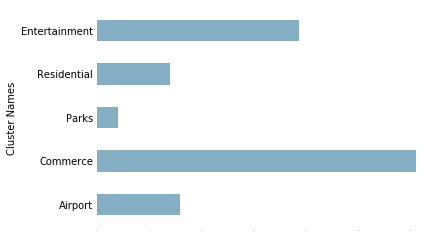

In [175]:
fig1, ax1 = plt.subplots()
ax1 = plt.axes(frameon = False)
plt.tick_params(axis= 'x', labelsize=0, length = 0)
plt.tick_params(axis = 'y', length = 0)
cluster_grouped.plot(x='Cluster Names', y='venue per neighborhood', kind = 'barh', ax = ax1, legend = False, color = '#84afc2')

In [181]:
venue_count.sort_values('Venue_Count', axis = 0, ascending = False, inplace = True)

venue_count = venue_count.reset_index()

venue_count.drop(['index'],axis = 1, inplace = True)

venue_count

,Neighborhood,Venue_Count,Cluster Labels
0,"Harbourfront East, Union Station, Toronto Islands",87,1
1,"Garden District, Ryerson",78,1
2,"Richmond, Adelaide, King",75,1
3,Stn A PO Boxes,74,1
4,"Toronto Dominion Centre, Design Exchange",72,1
5,"Commerce Court, Victoria Hotel",70,1
6,"First Canadian Place, Underground city",68,1
7,St. James Town,61,1
8,"Kensington Market, Chinatown, Grange Park",53,4
9,Church and Wellesley,50,1


In [182]:
top_venues = venue_count.head(10)

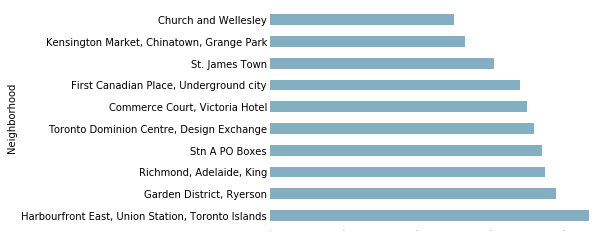

In [184]:
fig3, ax3 = plt.subplots()
ax3 = plt.axes(frameon = False)
plt.tick_params(axis= 'x', labelsize=0, length = 0)
plt.tick_params(axis = 'y', length = 0)
top_venues.plot(x='Neighborhood', y='Venue_Count', kind = 'barh', ax = ax3, legend = False, color = '#84afc2')

### Thank You

Date: 31st Oct, 2020

*Author: Subha Halder*